<a href="https://colab.research.google.com/github/ngebodh/GX_tES_EEG_Physio_Behavior/blob/master/examples/GX_tES_Importing_From_MAT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing the GX dataset and Analyzing Data

This notebook shows how to import the GX dataset into Python and do some basic analysis

<br>

**The code below shows how to download the downsampled `.mat` files from Zenodo for [Experiment 1](https://zenodo.org/records/8401160) or [Experiment 2](https://zenodo.org/records/3840617).**

<br>

Python supports importing `.mat` files since some versions are stored in `hdf5` format.


<br>

The GX dataset is provided as:
* Raw ANT neuro `.cnt` files (not Neuroscan `.cnt`; Can only be imported with Matlab for now, currently and [open issue](https://github.com/mne-tools/mne-python/issues/3609)), behavioral data provided separate.
* Downsampled (1k Hz) `.mat` files with behavioral data included
* BIDS formatted data, including EEGlab compatible `.set` files, behavioral data provided separate



See the main [GX dataset page](https://zenodo.org/record/4456079) and [Github](https://github.com/ngebodh/GX_tES_EEG_Physio_Behavior).


<br>

If you use the GX dataset or resources from it please be sure to cite our work as:




>Gebodh, N., Esmaeilpour, Z., Datta, A. et al. Dataset of concurrent EEG, ECG, and behavior with multiple doses of transcranial electrical stimulation. Sci Data 8, 274 (2021). https://doi.org/10.1038/s41597-021-01046-y


<br>
<br>

**Contact**:
* Nigel Gebodh
* ngebodh01@citymail.cuny.edu

#Contents

>[Importing the GX dataset and Analyzing Data](#scrollTo=BihV01dnXNrC)

>>[Import Libraries](#scrollTo=kOA2pW32iWSJ)

>>[Create Helper Functions](#scrollTo=sER_8UJAA5ZC)

>>[Download Mat files from Zenodo](#scrollTo=i0VzDUBzDt1u)

>>[Structure of the Mat file](#scrollTo=zCjK0DSeZVk4)

>>[Importing the Mat file](#scrollTo=u1XqxWLDesmw)

>>[Looking at File Contents and Triggers](#scrollTo=gMSHZpo2ehCd)

>>>[Extract Triggers to Dataframe](#scrollTo=QhJrRgAIAhp3)

>>[Extract Data fs and Channel Labels](#scrollTo=6xFByoRvEia9)

>>[Extract the Physio and CTT data](#scrollTo=q_jFNNbMkPiO)

>>>[Extract the Physio data and plot](#scrollTo=N6EXcrbFAGqi)

>>>[Extract the CTT (behavioral) data and plot](#scrollTo=cC7rg-KeATP1)

>>[Plot Both Physio and CTT Data](#scrollTo=cvsroipfAw93)

>>[Plot the Whole Session](#scrollTo=6ky2OVdTkakk)

>>[Lets look at one trial](#scrollTo=PKNZFn6Mu3G8)

>>>>[1) Get the triggers out](#scrollTo=jJlw0iE__tOL)

>>>>>[Stim Start Triggers](#scrollTo=KgUnsCCyj8aF)

>>>>>[Stim Stop Triggers](#scrollTo=dlLMXCpOkBEG)

>>>>[2) Use triggers to plot first trial](#scrollTo=blM9D_waIEUB)

>>[Do some basic analysis to the data](#scrollTo=gktRsDIsJG_P)

>>>[Pre Stimulation Data](#scrollTo=Y_RYLtGeXjWC)

>>>>[1)Extract the data segment](#scrollTo=DfIa2dskXpDp)

>>>>[2)Look at Pre Stim ECG](#scrollTo=pRVo_Wc_YJQI)

>>>>[3) Look at Pre Stim EEG and Plot FFT](#scrollTo=RFYXOIY1YPTc)

>>>[Post Stimulation Data](#scrollTo=zuQPJ_e9YY_n)

>>>>[1)Extract the data segment](#scrollTo=8fTA2-eUYc2y)

>>>>[2)Look at Post Stim ECG](#scrollTo=uG454Bl_doCy)

>>>>[3) Look at Post Stim EEG and Plot FFT](#scrollTo=OUUgQCSDdt1e)

>>>[Pre to Post Stim ECG and EEG](#scrollTo=BQFhDC2ofJed)

>>>>[1) Plot ECG changes](#scrollTo=w1GiU3CNNq_h)

>>>>[2) Plot EEG changes](#scrollTo=gSCuy7YqNuiY)



### Import Libraries

Here we'll import all the libraries we'll use for import and process the data

In [ ]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.signal import butter, sosfiltfilt
from math import e

try:
  import plotly.express as px
  import plotly.graph_objects as go
except:
  !pip install plotly
  import plotly.express as px
  import plotly.graph_objects as go

try:
  import neurokit2 as nk #For ECG and EEG analysis
except:
  !pip install neurokit2
  import neurokit2 as nk #For ECG and EEG analysis


#Libraries to install
#!pip install neurokit2 plotly

#Optional
#!pip install mat73

## Create Helper Functions

These are some helper functions to help load and process the data.


In [ ]:
#Helper Functions

#Define data importer from Zenodo
def import_data_from_zenodo(base_url, file_name):
  '''
  Import data from Zenodo
  base_url: str, the base URL of the Zenodo record
  file_name: str, the name of the file to download
  return: None, downloads the file to the current directory
  '''
  # Construct the full URL
  full_url = f"{base_url}{file_name}?download=1"

  # Use wget to download the file and show progress
  !wget -O {file_name} {full_url}
  return None



# Define the band-pass filter
def bandpass_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    sos = butter(order, [low, high], btype='band', output='sos')
    y = sosfiltfilt(sos, data, axis=1)
    return y



#Make the triggers into a Pandas dataframe
def make_triggers_dataframe(df):
  # iterate over each column
  for col in df.columns:
      # extract the first element from each array or list
      df[col] = df[col].apply(lambda x: x[0] if isinstance(x, list) or isinstance(x, np.ndarray) else x)

  return df



## Download Mat files from Zenodo

Here we use the helper function we created the download the `.mat` file from Zenodo to our current working directory.

We needed:
* The Zenodo's base URL `https://zenodo.org/records/3840617/files/`, which the the webpage where the data can be accessed
* The filenames that we want to download

In [ ]:
# Set the base URL and file name
base_url = "https://zenodo.org/records/3840617/files/"


#These are the example files I want to download for participants 23, session 02 and 19 session 01
#We'll download 2 files but only take a deep dive into one of them.
file_names = ["EEG_DS_Struct_2302.mat",
              "EEG_DS_Struct_1901.mat"]


# Download the files and show progress
for file_name in file_names:
  import_data_from_zenodo(base_url, file_name)



--2024-08-18 20:46:31--  https://zenodo.org/records/3840617/files/EEG_DS_Struct_2302.mat?download=1
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.185.79.172, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1129691612 (1.1G) [application/octet-stream]
Saving to: ‘EEG_DS_Struct_2302.mat’

EEG_DS_Struct_2302. 100%[===================>]   1.05G  26.5MB/s    in 47s     

2024-08-18 20:47:18 (23.2 MB/s) - ‘EEG_DS_Struct_2302.mat’ saved [1129691612/1129691612]

--2024-08-18 20:47:18--  https://zenodo.org/records/3840617/files/EEG_DS_Struct_1901.mat?download=1
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.98.238, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1124148094 (1.0G) [application/octet-stream]
Saving to: ‘EEG_DS_Struct_1901.mat’

EEG_DS_Struct_1901. 100%[======

In [ ]:
#Check files in my current directory
!ls

EEG_DS_Struct_1901.mat	EEG_DS_Struct_2302.mat	sample_data


##Structure of the Mat file
Below shows how the `.mat` file is organized:

```

DSamp
│   fs -Frequency of data sampling
│   fsOld -Original sampling frequency of data
|   nchan -Number of channels in data
|   rate -Redundant sampling frequency
│   npt -Number of data points
|   Subj -Subject ID and session number (i.e. '0701'- Subject 7,session 1)
|
└───triggers -Contains all EEG trigger events
│   │   time -All trigger times
│   │   offset -Offset value of trigger
|   |   code -Trigger codes ('02'-Block start, '16'-Stim start, '32'-Stim stop)
|   |   Label -Trigger labels ('02'-Block start, '16'-Stim start, '32'-Stim stop)
│   │   StimType -Labels for the type of stimulation that was applied ('F'-Frontal, 'M'- Motor, 'P'- Parietal, number indicated the frequency of stim i.e. F30 means frontal stimulation at 30 Hz)
│   
└───EEGdata -Contains all the sampled data (size: 35Xnpt)
│   
└───time -Contains the time vector for the sampled data in "data"
│   
└───label -Contains all the channel labels for the data
│   
└───ptrackerPerf -Contains all the continuous CTT data over time
│   
└───ptrackerTime -Contains the time axis for the `ptrackerPerf` variable
│   
└───ptrackerfs-Contains the sampling frequency for the `ptrackerPerf` task

```

## Importing the Mat file

Here we import the downloaded `.mat` file data to work with.

In [ ]:
from scipy import io #Import Scipy Library.
#Alternative is mat73 for *.mat import install with !pip install mat73

file_names = ["EEG_DS_Struct_2302.mat",
              "EEG_DS_Struct_1901.mat"]



X =io.loadmat(file_names[0]) #Load the matfile


In [ ]:
X['DSamp'] #Print contents of file (see Structure of the MAT file)

array([[(array([[(array([[7.809]]), array([[7810]], dtype=uint16), array(['0002'], dtype='<U4'), array([[2]], dtype=uint8), array(['Block Start'], dtype='<U11'), array([], shape=(1, 0), dtype=float64)),
                (array([[1207.844]]), array([[1207845]], dtype=int32), array(['0002'], dtype='<U4'), array([[2]], dtype=uint8), array(['Block Start'], dtype='<U11'), array([], shape=(1, 0), dtype=float64)),
                (array([[1207.876]]), array([[1207877]], dtype=int32), array(['0016'], dtype='<U4'), array([[16]], dtype=uint8), array(['Stim Start'], dtype='<U10'), array(['M30'], dtype='<U3')),
                (array([[1243.122]]), array([[1243123]], dtype=int32), array(['0032'], dtype='<U4'), array([[32]], dtype=uint8), array(['Stim Stop'], dtype='<U9'), array([], shape=(1, 0), dtype=float64)),
                (array([[1357.882]]), array([[1357883]], dtype=int32), array(['0016'], dtype='<U4'), array([[16]], dtype=uint8), array(['Stim Start'], dtype='<U10'), array(['M30'], dtype='<

## Looking at File Contents and Triggers


In [ ]:
#Let's look at 10 [0:10] samples from channels 1-3 [0,1,2]

chans_indx = [0, 1, 2] #Channles to look at
time_indx = [0, 10] #Time index start, stop



#Print the channel labels
chan_labels = X['DSamp']['label'][0][0][chans_indx]

# Extract the strings from the arrays
chan_labels_out = [label[0][0] for label in chan_labels]

print(chan_labels_out)




#Print the data for selected channels
X['DSamp']['EEGdata'][0][0][chans_indx,
                            time_indx[0]:time_indx[1]] #Look at the data


['Fp1', 'Fpz', 'Fp2']


array([[-18904.78019372, -18907.5740633 , -18911.07953735,
        -18908.72305846, -18912.50759904, -18906.90856874,
        -18908.39092803, -18909.26395708, -18915.24182293,
        -18915.23331434],
       [-25282.04342465, -25282.85833226, -25285.63591312,
        -25287.1956704 , -25287.00762179, -25279.7136814 ,
        -25282.39545133, -25283.62588652, -25287.52983541,
        -25287.62342563],
       [-23378.03004043, -23384.38019204, -23388.63348651,
        -23389.9765413 , -23391.66894625, -23383.02431126,
        -23379.51309537, -23377.0494802 , -23380.49852557,
        -23378.92986633]])

In [ ]:
#Take a look at all the triggers in the file
val=X['DSamp']['triggers'][0,0] #Look at the triggers for the data
val['Label'] #Look at Trigger labels

array([[array(['Block Start'], dtype='<U11'),
        array(['Block Start'], dtype='<U11'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start'], dtype='<U10'),
        array(['Stim Stop'], dtype='<U9'),
        array(['Stim Start']

In [ ]:
val['code'][0]#Look at Trigger codes

array([array(['0002'], dtype='<U4'), array(['0002'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U4'),
       array(['0016'], dtype='<U4'), array(['0032'], dtype='<U

### Extract Triggers to Dataframe

Here we pull out all the triggers from the recording and place it into a pandas dataframe for easier handling and for pull out specific times in the EEG, and CTT data.

In [ ]:
#Extract all triggers to a pandas dictionary for processing
df_triggers = pd.DataFrame.from_records(X['DSamp']['triggers'][0,0][0])

In [ ]:
df_triggers_out = make_triggers_dataframe(df_triggers) #See function above
df_triggers_out.head(25) #Print the 1st 25 entries

,time,offset,code,type,Label,StimType
0,[7.809],[7810],0002,[2],Block Start,[]
1,[1207.844],[1207845],0002,[2],Block Start,[]
2,[1207.876],[1207877],0016,[16],Stim Start,M30
3,[1243.122],[1243123],0032,[32],Stim Stop,[]
4,[1357.882],[1357883],0016,[16],Stim Start,M30
5,[1392.961],[1392962],0032,[32],Stim Stop,[]
6,[1507.928],[1507929],0016,[16],Stim Start,M30
7,[1543.02],[1543021],0032,[32],Stim Stop,[]
8,[1657.872],[1657873],0016,[16],Stim Start,M30
9,[1693.043],[1693044],0032,[32],Stim Stop,[]


## Extract Data `fs` and Channel Labels

In [ ]:
#Get the sampling frequencies for the EEG and the CTT (behavioral) data
fs_eeg = X['DSamp']['fs'][0][0][0][0] # 1000 Hz
fs_ctt = X['DSamp']['ptrackerfs'][0][0][0][0] #100 Hz

In [ ]:
#Pull out the EEG Channel labels
chan_lables = X['DSamp']['label'][0][0][:]

# Extract the strings from the arrays
channel_labels = [label[0][0] for label in chan_lables]

#Rename the last few channels to 'ECG' and 'EOG'
channel_labels[32] = 'ECG'
channel_labels[33] = 'EOG'

channel_labels

['Fp1',
 'Fpz',
 'Fp2',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'FC5',
 'FC1',
 'FC2',
 'FC6',
 'M1',
 'T7',
 'C3',
 'Cz',
 'C4',
 'T8',
 'M2',
 'CP5',
 'CP1',
 'CP2',
 'CP6',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'POz',
 'O1',
 'Oz',
 'O2',
 'ECG',
 'EOG',
 'RESP1']

## Extract the Physio and CTT data

### Extract the Physio data and plot

Here we'll pull out the physio data and plot it.

In [ ]:
#Extract Physio data
Physio_data = X['DSamp']['EEGdata'][0][0]
print(np.shape(Physio_data)) #Should be Chans X Time (in samples)




start_time = 0 #In sec
end_time = 10 #In sec
chan_in = ['Fp1', 'Fpz', 'Fp2','ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in] #Get the channel index
fs_eeg = X['DSamp']['fs'][0][0][0][0] # 1000 Hz


start_indx = fs_eeg*start_time
end_indx = fs_eeg*end_time
time_in = np.arange(start_time, end_time, 1/fs_eeg)


import plotly.express as px
fig = go.Figure()
for chan in chan_in:
  dat_in = Physio_data[channel_labels.index(chan),start_indx :end_indx ]
  dat_in = dat_in - np.mean(dat_in)
  fig.add_scatter(x=time_in, y=dat_in ,
                mode='lines',
                name=chan)
  fig.update_layout(
    title="EEG Data Plot",
    xaxis_title="Time(sec)",
    yaxis_title="Amplitude",
    legend_title="Channels"
                    )
fig.show()


(35, 4247524)


### Extract the CTT (behavioral) data and plot

Here we'll pull out the CTT (behavioral) data and plot it.

In [ ]:
#Extract CTT (behavioral) data
CTT_data = np.squeeze(X['DSamp']['ptrackerPerf'][0][0][:])
print(np.shape(CTT_data)) #Should be of length Time




start_time = 0 #In sec
end_time = 10 #In sec

fs_ctt = X['DSamp']['ptrackerfs'][0][0][0][0] #100 Hz
chan_in = ['CTT']
start_indx = fs_ctt*start_time
end_indx = fs_ctt*end_time
time_in = np.arange(start_time, end_time, 1/fs_ctt)


import plotly.express as px
fig = go.Figure()
for chan in chan_in:
  dat_in = CTT_data[start_indx :end_indx ]
  fig.add_scatter(x=time_in, y= dat_in,
                mode='lines',
                name=chan)
  fig.update_layout(
    title="CTT Data Plot",
    xaxis_title="Time(sec)",
    yaxis_title="Amplitude",
    legend_title="Channels"
                    )
fig.show()

(420002,)


## Plot Both Physio and CTT Data

Here we will plot both data types.
To do this we will filter by time to get the matching samples in both data types. We need to do this since the Physio data is sampled at `fs = 1000 Hz` and the CTT data is sampled at `fs = 100 Hz`



In [ ]:
# Define the time vector and data segment
start_time = 0 #In seconds
end_time = 30 #In seconds


chan_in = ['Fp1', 'Fpz', 'ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]

#Get the time vectors for each data type
eeg_time_in = X['DSamp']['time'][0][0][0][:]
ctt_time_in = np.squeeze(X['DSamp']['ptrackerTime'][0][0][:])



#Extract the Physio data over the time period we want
eeg_indicies = np.where((eeg_time_in>=start_time) & (eeg_time_in<=end_time))[0]
eeg_data_in = Physio_data[:,eeg_indicies] #Extracted above
eeg_time_plot = eeg_time_in[eeg_indicies]

#Extract the CTT data over the time period we want
ctt_indicies = np.where((ctt_time_in>=start_time) & (ctt_time_in<=end_time))
ctt_data_in = CTT_data[ctt_indicies] #Extracted above
ctt_time_plot = ctt_time_in[ctt_indicies]


#-------------------------------------------------------------------------------
#             Extra - Filter the Physio data
#Filter the physio data
lowcut = 0.5  # Lower frequency bound (Hz)
highcut = 30.0  # Upper frequency bound (Hz)
fs_eeg = X['DSamp']['fs'][0][0][0][0] # 1000 Hz


# Apply the filter to each channel using the axis parameter
eeg_data_in = bandpass_filter(eeg_data_in, lowcut, highcut, fs_eeg)

#-------------------------------------------------------------------------------



#Plot the data
import plotly.express as px
fig = go.Figure()

#Loop through the Physio channels and plot each
for chan in chan_in:
  dat_in = eeg_data_in[channel_labels.index(chan),:]
  fig.add_scatter(x=eeg_time_plot,
                  y= dat_in,
                mode='lines',
                name=chan)

#Add a plot of the CTT data
chan='CTT'
dat_in= ctt_data_in
fig.add_scatter(x=ctt_time_plot,
                y= dat_in,
              mode='lines',
              name=chan)

#Add labels
fig.update_layout(
  title="Data Plot",
  xaxis_title="Time(sec)",
  yaxis_title="Amplitude",
  legend_title="Channels"
                  )

fig.show()



## Plot the Whole Session

Here we'll plot the whole session to see changes in EEG/ECG/CTT over the ~70 min session.

We will plot:
* The CTT data over the course of the experiment
* An EEG channel the voltage changes indicate when stimulation was on and look like a large voltage offset.
* The ECG data over time
* All the triggers that indicate stimulation and block start/stop



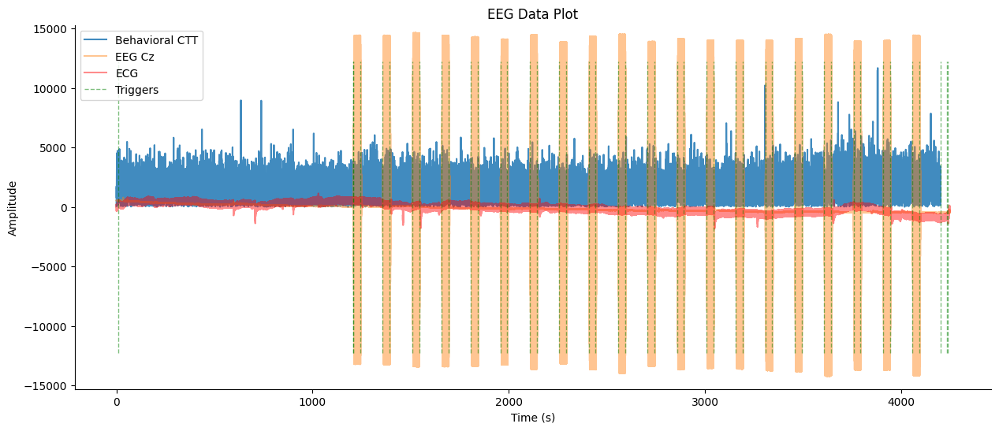

In [ ]:
plt.figure(figsize=(15, 6))


####################################
#Plot the CTT
dat_in =  np.squeeze(CTT_data)*100
plt.plot(np.squeeze(ctt_time_in), dat_in,
         alpha=0.851,
         label = "Behavioral CTT")
#___________________________________




####################################
#Plot the EEG
chan_in = ['C3'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]

dat_in =  np.squeeze(Physio_data[chan_indices,:])
dat_in_max = np.max(dat_in)
plt.plot(np.squeeze(eeg_time_in), dat_in - np.mean(dat_in),
         alpha=0.45,
         label = "EEG Cz")
#___________________________________



####################################
#Plot the ECG
chan_in = ['ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]

dat_in =  np.squeeze(Physio_data[chan_indices,:])
plt.plot(np.squeeze(eeg_time_in), dat_in - np.mean(dat_in),
         alpha=0.45,color='r',
         label = "ECG")
#___________________________________




####################################
#Plot the Triggers

#Get the trigger times out for plotting
triggers_time = [item[0] for item in df_triggers_out['time']]
plt.vlines(triggers_time,
           ymin=-dat_in_max, ymax=dat_in_max,
           colors='g', linestyles='--', linewidth=1,
           alpha = 0.5,
           label="Triggers")
#___________________________________


plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('EEG Data Plot')
plt.ylim(np.array([-1.25,  1.25])*dat_in_max)
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.legend()
plt.show()

## Lets look at one trial

#### 1) Get the triggers out

##### **Stim Start Triggers**
These are the triggers that start the stimulation and initiate the stimulation ramp up.

In [ ]:
#Pull out the Stim start triggers
triggers_stimstart = df_triggers_out.query('Label=="Stim Start"')#Look for only "Stim Start" in the dataframe
triggers_stimstart.head()

,time,offset,code,type,Label,StimType
2,[1207.876],[1207877],0016,[16],Stim Start,M30
4,[1357.882],[1357883],0016,[16],Stim Start,M30
6,[1507.928],[1507929],0016,[16],Stim Start,M30
8,[1657.872],[1657873],0016,[16],Stim Start,M30
10,[1807.869],[1807870],0016,[16],Stim Start,M30


In [ ]:
#Loop through elements to only get the times
ii= [item[0] for item in triggers_stimstart['time']]

#Reset the index
triggers_stimstart.reset_index(drop=True, inplace=True)
#Re assign the time column with just the times without the brackets
triggers_stimstart = triggers_stimstart.assign(time=ii)

#Look at the dataframe, we see "time" is now without brackets
triggers_stimstart.head()

,time,offset,code,type,Label,StimType
0,1207.876,[1207877],0016,[16],Stim Start,M30
1,1357.882,[1357883],0016,[16],Stim Start,M30
2,1507.928,[1507929],0016,[16],Stim Start,M30
3,1657.872,[1657873],0016,[16],Stim Start,M30
4,1807.869,[1807870],0016,[16],Stim Start,M30


In [ ]:
#Lets look at the first stim trial
triggers_stimstart.iloc[0]

,0
time,1207.876
offset,[1207877]
code,0016
type,[16]
Label,Stim Start
StimType,M30


##### **Stim Stop Triggers**
These are the triggers that stop the stimulation and initiate the stimulation ramp down. Please note that there is sometimes a ~600 ms delay in voltage rebound after the 5 sec ramp down.

In [ ]:
#Pull out the Stim start triggers
triggers_stimstop = df_triggers_out.query('Label=="Stim Stop"')#Look for only "Stim Start" in the dataframe
triggers_stimstop.head()

,time,offset,code,type,Label,StimType
3,[1243.122],[1243123],0032,[32],Stim Stop,[]
5,[1392.961],[1392962],0032,[32],Stim Stop,[]
7,[1543.02],[1543021],0032,[32],Stim Stop,[]
9,[1693.043],[1693044],0032,[32],Stim Stop,[]
11,[1843.008],[1843009],0032,[32],Stim Stop,[]


In [ ]:
#Loop through elements to only get the times
ii= [item[0] for item in triggers_stimstop['time']]

#Reset the index
triggers_stimstop.reset_index(drop=True, inplace=True)
#Re assign the time column with just the times without the brackets
triggers_stimstop = triggers_stimstop.assign(time=ii)

#Look at the dataframe, we see "time" is now without brackets
triggers_stimstop.head()

,time,offset,code,type,Label,StimType
0,1243.122,[1243123],0032,[32],Stim Stop,[]
1,1392.961,[1392962],0032,[32],Stim Stop,[]
2,1543.020,[1543021],0032,[32],Stim Stop,[]
3,1693.043,[1693044],0032,[32],Stim Stop,[]
4,1843.008,[1843009],0032,[32],Stim Stop,[]


#### 2) Use triggers to plot first trial

Here we will plot one whole trial.
This includes the pre, during and post stimulation periods. See d in Figure 1 [here](https://www.brainstimjrnl.com/article/S1935-861X(24)00091-3/fulltext).


In [ ]:
# Define times for each data segment
time_before_trig = 30 #30 secs before the triiger gives us the "pre" stim
time_ramp_up = 5 # It takes 5 secs for the current to ramp up
time_stim_on = 30 #The current is on for 30 secs
time_ramp_down = 5 #It takes 5 secs for the current to ramp down
time_after_trig = 30 #30 secs after the stim (ramp up + stim on + ramp down) is over gives us the "post" stim


#Trigger minus 30 secs
trial_start = triggers_stimstart.iloc[0]['time'] - time_before_trig

#Stimulation on = ramp up + stim on time + ramp down
trial_end =  triggers_stimstop.iloc[0]['time'] + time_ramp_down + time_after_trig




# Define the time vector and data segment
start_time = trial_start
end_time = trial_end


chan_in = ['C3', 'ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]

eeg_time_in = X['DSamp']['time'][0][0][0][:]
ctt_time_in = np.squeeze(X['DSamp']['ptrackerTime'][0][0][:])




eeg_indicies = np.where((eeg_time_in>=start_time) & (eeg_time_in<=end_time))[0]
# eeg_data_in = Physio_data[np.ix_(chan_indices,eeg_indicies)]
eeg_data_in = Physio_data[:,eeg_indicies]
eeg_time_plot = eeg_time_in[eeg_indicies]

ctt_indicies = np.where((ctt_time_in>=start_time) & (ctt_time_in<=end_time))
ctt_data_in = CTT_data[ctt_indicies]
ctt_time_plot = ctt_time_in[ctt_indicies]
print(trial_start, trial_end)








import plotly.express as px
fig = go.Figure()
for chan in chan_in:
  dat_in = eeg_data_in[channel_labels.index(chan),:]
  dat_in = dat_in - np.mean(dat_in)
  if chan == 'ECG':
     dat_in =  dat_in*10
  fig.add_scatter(x=eeg_time_plot,
                  y= dat_in,
                mode='lines',
                name=chan)

chan='CTT'
dat_in= ctt_data_in*100
fig.add_scatter(x=ctt_time_plot,
                y= dat_in,
              mode='lines',
              name=chan)

fig.update_layout(
  title="Data Plot",
  xaxis_title="Time(sec)",
  yaxis_title="Amplitude",
  legend_title="Channels"
                  )

fig.show()


1177.876 1278.122


## Do some basic analysis to the data

Here we do some basic analysis to the extracted data. Note that minimal to no preprocessing is done since this is just to demonstrate data usage.

### Pre Stimulation Data

#### 1)Extract the data segment

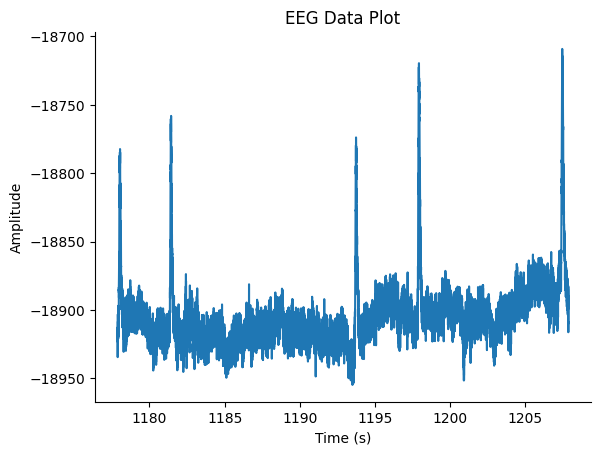

In [ ]:
# Define times for each data segment
time_before_trig = 30 #30 secs before the triiger gives us the "pre" stim
time_ramp_up = 5 # It takes 5 secs for the current to ramp up
time_stim_on = 30 #The current is on for 30 secs
time_ramp_down = 5 #It takes 5 secs for the current to ramp down
time_after_trig = 30 #30 secs after the stim (ramp up + stim on + ramp down) is over gives us the "post" stim


#We just want to pre period so this is -30 secs from the trigger.
#Trigger minus 30 secs
trial_start = triggers_stimstart.iloc[0]['time'] - time_before_trig # Pre stim starts 30 secs before the trigger
trial_end =  triggers_stimstart.iloc[0]['time']  #Pre stim ends at trigger time




# Define the time vector and data segment
start_time = trial_start
end_time = trial_end

eeg_time_in = X['DSamp']['time'][0][0][0][:]


eeg_indicies = np.where((eeg_time_in>=start_time) & (eeg_time_in<=end_time))[0]
eeg_data_pre = Physio_data[:,eeg_indicies]
eeg_time_plot_pre = eeg_time_in[eeg_indicies]

plt.plot(eeg_time_plot_pre , np.squeeze(eeg_data_pre[0, :]))
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('EEG Data Plot')
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.show()

#### 2)Look at Pre Stim ECG

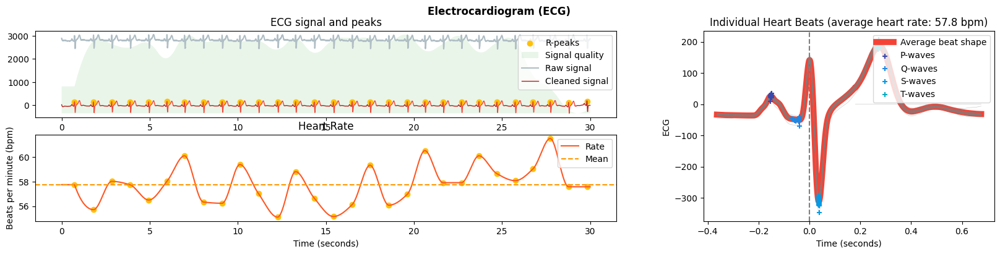

In [ ]:
chan_in = ['ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]


# Process ecg
signals_out_pre, info_pre = nk.ecg_process(np.squeeze(eeg_data_pre[chan_indices,:]), sampling_rate=fs_eeg)
nk.ecg_plot(signals_out_pre, info_pre)


fig = plt.gcf()
# Set the figure size
fig.set_size_inches(20, 4)  # Adjust the size as needed
# Show the plot
plt.show()

Looking at HRV outcomes

/usr/local/lib/python3.10/dist-packages/neurokit2/hrv/hrv_nonlinear.py:529: NeuroKitWarning:

DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.

/usr/local/lib/python3.10/dist-packages/neurokit2/complexity/entropy_multiscale.py:349: RuntimeWarning:

invalid value encountered in scalar divide

/usr/local/lib/python3.10/dist-packages/neurokit2/complexity/entropy_multiscale.py:349: RuntimeWarning:

invalid value encountered in scalar divide

/usr/local/lib/python3.10/dist-packages/neurokit2/complexity/entropy_multiscale.py:349: RuntimeWarning:

invalid value encountered in scalar divide



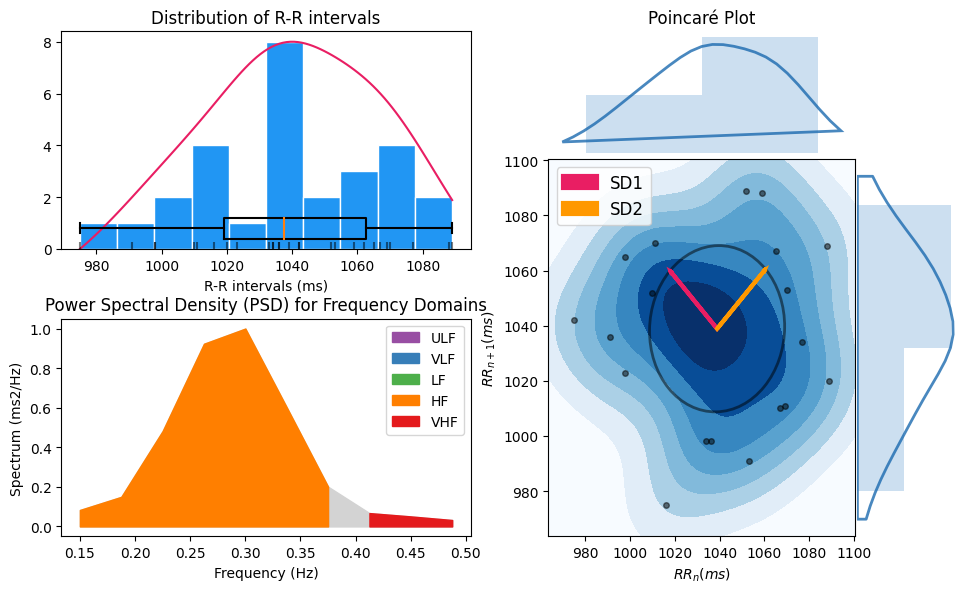

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,1038.892857,29.573937,NaN,NaN,NaN,NaN,NaN,NaN,40.585073,41.33709,...,inf,4.521641,1.56269,NaN,NaN,NaN,1.339116,1.997592,3.050957,1.545221


In [ ]:
#Compute HRV outcomes
hrv_indices_pre = nk.hrv(signals_out_pre, sampling_rate=fs_eeg, show=True)

fig = plt.gcf()
# Set the figure size
fig.set_size_inches(10, 6)  # Adjust the size as needed
# Show the plot
plt.show()


hrv_indices_pre

#### 3) Look at Pre Stim EEG and Plot FFT

In [ ]:
chan_in = ['Fp1','O1', 'C3'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]



# Apply the filter to each channel using the axis parameter
eeg_data_pre = bandpass_filter(eeg_data_pre, 0.5, 30, fs_eeg)



# Compute the PSD using the Welch method and collect data
df_dummy = pd.DataFrame()
for indx, chan in enumerate(chan_in):
  ii = channel_labels.index(chan)
  dat_in = np.squeeze(eeg_data_pre[ii ,:])
  psd_welch = nk.signal_psd(dat_in, method="welch", min_frequency=1, show=False)
  if indx == 0:
    df_dummy['Frequency'] = psd_welch['Frequency']
    df_dummy[chan] = psd_welch['Power']
  else:
    df_dummy[chan] = psd_welch['Power']


df_pre_psd = df_dummy


#Plot the data
import plotly.express as px
fig = go.Figure()
fig.update_layout(
    width=800,
)

#Loop through the Physio channels and plot each
for chan in chan_in:
  dat_in = df_dummy[chan]
  fig.add_scatter(x=df_dummy['Frequency'],
                  y= dat_in,
                mode='lines',
                name=chan)

#Add labels
fig.update_layout(
  title="Data Plot",
  xaxis_title="$Frequency (Hz)$",
  yaxis_title="$Amplitude$",
  legend_title="Channels"
                  )
fig.update_xaxes(range = [0, 30])
fig.show()


### Post Stimulation Data

#### 1)Extract the data segment

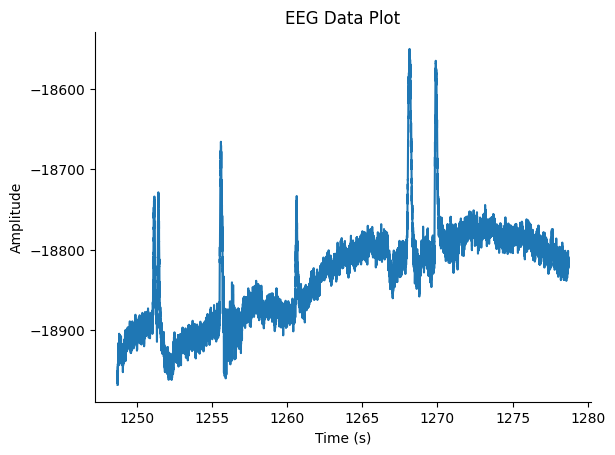

In [ ]:
# Define times for each data segment
time_before_trig = 30 #30 secs before the triiger gives us the "pre" stim
time_ramp_up = 5 # It takes 5 secs for the current to ramp up
time_stim_on = 30 #The current is on for 30 secs
time_ramp_down = 5 #It takes 5 secs for the current to ramp down
time_after_trig = 30 #30 secs after the stim (ramp up + stim on + ramp down) is over gives us the "post" stim


#We just want to post period so this is the trigger stop plus 30 secs (NOTE! there is a slight 600 ms delay in voltage after stim ramp down)
time_voltage_rebound = 0.6 #Approximate voltage rebound time
trial_start = triggers_stimstop.iloc[0]['time']  + time_ramp_down + time_voltage_rebound # Post stim starts after the stim stop trigger plus a small dealy for voltage rebound
trial_end =  triggers_stimstop.iloc[0]['time']   + time_ramp_down + time_voltage_rebound + time_after_trig #Post stim ends 30 secs after stim stop+ ramp down + voltage rebound (~600 ms)




# Define the time vector and data segment
start_time = trial_start
end_time = trial_end

eeg_time_in = X['DSamp']['time'][0][0][0][:]


eeg_indicies = np.where((eeg_time_in>=start_time) & (eeg_time_in<=end_time))[0]
eeg_data_post= Physio_data[:,eeg_indicies]
eeg_time_plot_post = eeg_time_in[eeg_indicies]

plt.plot(eeg_time_plot_post , np.squeeze(eeg_data_post[0, :]))
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('EEG Data Plot')
for pos in ['right', 'top']:
    plt.gca().spines[pos].set_visible(False)
plt.show()

#### 2)Look at Post Stim ECG

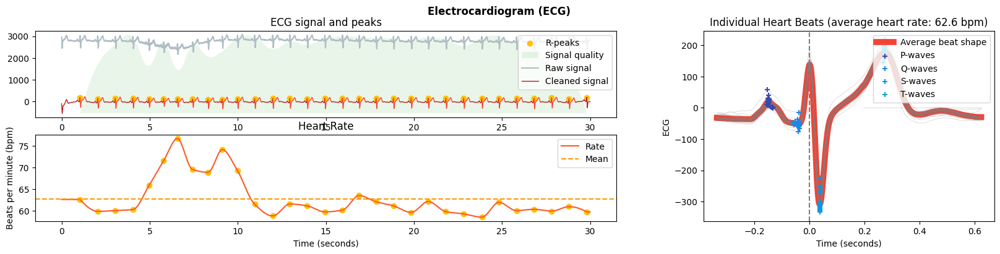

In [ ]:
chan_in = ['ECG'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]


# Process ecg
signals_out_post, info_post = nk.ecg_process(np.squeeze(eeg_data_post[chan_indices,:]), sampling_rate=fs_eeg)
nk.ecg_plot(signals_out_post, info_post)


fig = plt.gcf()
# Set the figure size
fig.set_size_inches(20, 4)  # Adjust the size as needed
# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/neurokit2/hrv/hrv_nonlinear.py:529: NeuroKitWarning:

DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.



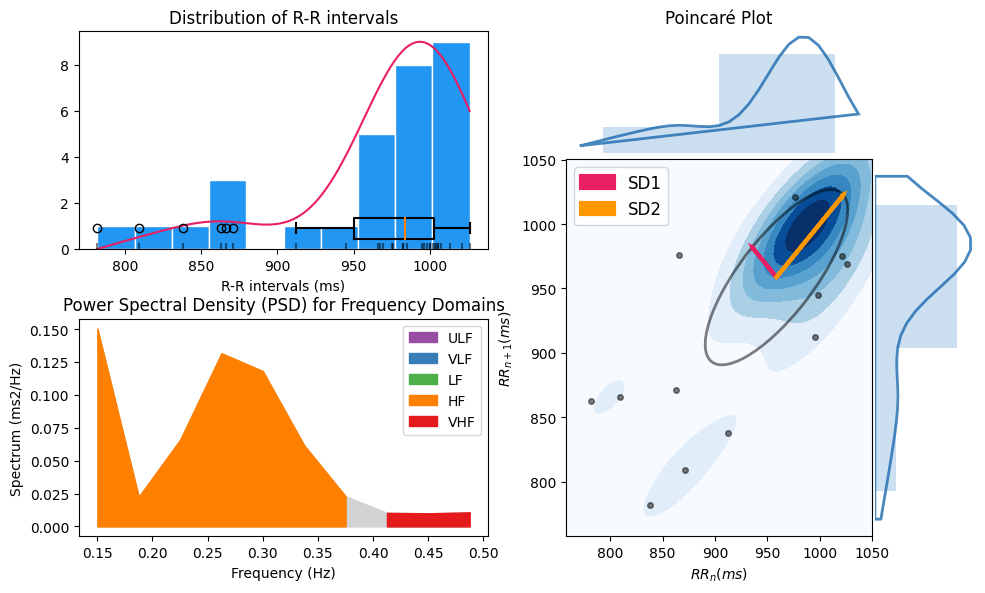

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,958.766667,66.983623,NaN,NaN,NaN,NaN,NaN,NaN,45.017238,45.814011,...,1.386294,4.706891,1.079175,0.0,0.0,0.0,1.406705,1.69869,1.832142,0.981378


In [ ]:
#Compute HRV outcomes
hrv_indices_post = nk.hrv(signals_out_post, sampling_rate=fs_eeg, show=True)

fig = plt.gcf()
# Set the figure size
fig.set_size_inches(10, 6)  # Adjust the size as needed
# Show the plot
plt.show()


hrv_indices_post

#### 3) Look at Post Stim EEG and Plot FFT

In [ ]:
chan_in = ['Fp1','O1', 'C3'] #Look at this channel
chan_indices = [channel_labels.index(item) for item in chan_in]



# Apply the filter to each channel using the axis parameter
eeg_data_post = bandpass_filter(eeg_data_post, 0.5, 30, fs_eeg)



# Compute the PSD using the Welch method and collect data
df_dummy = pd.DataFrame()
for indx, chan in enumerate(chan_in):
  ii = channel_labels.index(chan)
  dat_in = np.squeeze(eeg_data_post[ii ,:])
  psd_welch = nk.signal_psd(dat_in, method="welch", min_frequency=1, show=False)
  if indx == 0:
    df_dummy['Frequency'] = psd_welch['Frequency']
    df_dummy[chan] = psd_welch['Power']
  else:
    df_dummy[chan] = psd_welch['Power']



df_post_psd = df_dummy

#Plot the data
import plotly.express as px
fig = go.Figure()
fig.update_layout(
    width=800,
)

#Loop through the Physio channels and plot each
for chan in chan_in:
  dat_in = df_dummy[chan]
  fig.add_scatter(x=df_dummy['Frequency'],
                  y= dat_in,
                mode='lines',
                name=chan)

#Add labels
fig.update_layout(
  title="Data Plot",
  xaxis_title="$Frequency (Hz)$",
  yaxis_title="$Amplitude$",
  legend_title="Channels"
                  )
fig.update_xaxes(range = [0, 30])
fig.show()

### Pre to Post Stim ECG and EEG

#### 1) Plot ECG changes

In [ ]:
post_BPM = (1/np.diff(info_post['ECG_R_Peaks']))*60000
pre_BPM = (1/np.diff(info_pre['ECG_R_Peaks']))*60000

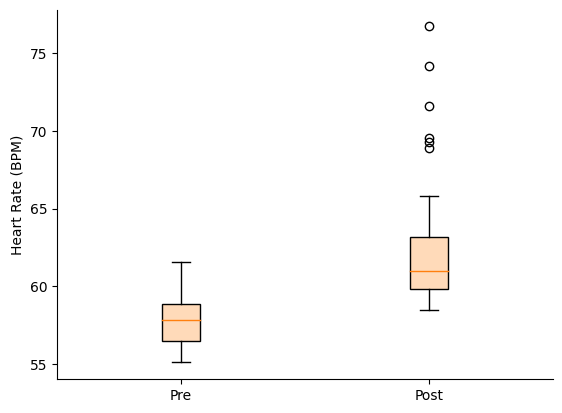

In [ ]:
#Plot the RR intervals in BPM
labels = ['Pre', 'Post']
colors = ['peachpuff', 'peachpuff']

fig, ax = plt.subplots()


bplot = ax.boxplot([pre_BPM, post_BPM],
                   patch_artist=True,  # fill with color
                   )


ax.set_ylabel('Heart Rate (BPM)')
ax.set_xticklabels(labels)

# fill with colors
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

for pos in ['right', 'top']:
  plt.gca().spines[pos].set_visible(False)
plt.show()

#### 2) Plot EEG changes

In [ ]:
#Plot the data
import plotly.express as px
fig = go.Figure()
fig.update_layout(
    width=800,
)

#Loop through the Physio channels and plot each
for chan in chan_in:
  dat_in = df_pre_psd[chan]
  fig.add_scatter(x=df_pre_psd['Frequency'],
                  y= dat_in,
                mode='lines',
                name=chan+' Pre')
  dat_in = df_post_psd[chan]
  fig.add_scatter(x=df_post_psd['Frequency'],
                  y= dat_in,
                mode='lines',
                name=chan+' Post')

#Add labels
fig.update_layout(
  title="Data Plot",
  xaxis_title="$Frequency (Hz)$",
  yaxis_title="$Amplitude$",
  legend_title="Channels"
                  )
fig.update_xaxes(range = [0, 30])
fig.show()